## 1. Loading data

We start by importing the libraries we need: 
- sklearn and numpy to do machine learning, 
- csv and pickle read the data and write out submission and model files, 
- time and os to keep organized with the files we output,
- matplotlib to perform visualizations.
We also import some specific sklearn components as well as an utils library with some handy extra functions.

In [1]:
import sklearn
import numpy as np
import csv
import pickle
import time
import os
import matplotlib.pyplot as plt

%matplotlib inline

from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.model_selection import KFold, GridSearchCV

import sys
import os
from pathlib import Path
sys.path.append(str(Path.cwd().parent))


from utils_general import utils_for_students

In [2]:
train_samples = utils_for_students.load_dataset_stage2('../data/stage2_labels_train.csv', 'train')
test_samples = utils_for_students.load_dataset_stage2('../data/stage2_ids_test.csv', 'test')

In [3]:
train_samples[0].keys()

dict_keys(['path', 'id', 'label', 'signer'])

In order to get a better grasp of every class in the dataset, we provide some additional information here.

There are 15 different classes. Each class corresponds to a sign. Signs can be annotated using sign glosses, which are representations of signs in written form in a spoken language. In the below table, we list all glosses, the English meaning of the corresponding sign, and provide a link to the Flemish sign language dictionary so that you can see an example performance of that sign.

| Gloss             | English meaning | Dictionary URL                                                                                        |
|-------------------|-----------------|-------------------------------------------------------------------------------------------------------|
| c.AF              | Done, finished  | https://vlaamsegebarentaal.be/signbank/dictionary/protected_media/glossvideo/AF/AF-B-209.mp4          |
| c.OOK             | Too, also       | https://vlaamsegebarentaal.be/signbank/dictionary/protected_media/glossvideo/OO/OOK-A-8491.mp4        |
| ZELFDE-A          | The same        | https://vlaamsegebarentaal.be/signbank/dictionary/protected_media/glossvideo/ZE/ZELFDE-A-14290.mp4    |
| AUTO-RIJDEN-A     | To drive a car  | https://vlaamsegebarentaal.be/signbank/dictionary/protected_media/glossvideo/RI/RIJDEN-C-9982.mp4     |
| HEBBEN-A          | To have         | https://vlaamsegebarentaal.be/signbank/dictionary/protected_media/glossvideo/HE/HEBBEN-A-4801.mp4     |
| HAAS-oor          | Hare            | https://vlaamsegebarentaal.be/signbank/dictionary/protected_media/glossvideo/HA/HAAS-B-16147.mp4      |
| AANKOMEN-A        | To arrive       | https://vlaamsegebarentaal.be/signbank/dictionary/protected_media/glossvideo/AA/AANKOMEN-A-39.mp4     |
| SCHILDPAD-Bhanden | Turtle          | https://vlaamsegebarentaal.be/signbank/dictionary/protected_media/glossvideo/SC/SCHILDPAD-A-10503.mp4 |
| WAT-A             | What            | https://vlaamsegebarentaal.be/signbank/dictionary/protected_media/glossvideo/WA/WAT-A-13657.mp4       |
| c.ZIEN            | To see          | https://vlaamsegebarentaal.be/signbank/dictionary/protected_media/glossvideo/BE/BEKIJKEN-A-1157.mp4   |
| NAAR-A            | Towards         | https://vlaamsegebarentaal.be/signbank/dictionary/protected_media/glossvideo/GA/GA-NAAR-A-4032.mp4    |
| MOETEN-A          | To must         | https://vlaamsegebarentaal.be/signbank/dictionary/protected_media/glossvideo/MO/MOETEN-D-17652.mp4    |
| C: 1              | 1               | https://vlaamsegebarentaal.be/signbank/dictionary/protected_media/glossvideo/1-/1-A-15277.mp4         |
| GOED-A            | Good            | https://vlaamsegebarentaal.be/signbank/dictionary/protected_media/glossvideo/GO/GOED-C-4413.mp4       |
| C: 2              | 2               | https://vlaamsegebarentaal.be/signbank/dictionary/protected_media/glossvideo/2-/2-A-15278.mp4         |

In [4]:
from utils_feature_preprocessing.transform_frames import transform_to_k_frames, frames_to_features
from utils_feature_preprocessing.correct_zeros_interpolation import correct_zeros_interpolation
from utils_feature_preprocessing.enlarge_hands import enlarge_hands
from utils_feature_preprocessing.features_from_hand import extract_finger_distances,extract_average_hands
from utils_feature_preprocessing.remove_face import remove_face,remove_face_and_hands

def transform(pose_sequence, k):
    pose_sequence = correct_zeros_interpolation(pose_sequence)
    pose_sequence = transform_to_k_frames(pose_sequence, k=k)
    return pose_sequence
    

In [5]:
# Concatenate the training set features.
original_X_train = []
X_train = []
y_train = []
K = 4

for sample in train_samples:
    pose_sequence = utils_for_students.load_sample_stage2(os.path.join('../data/stage2/train/', sample['path']))
    original_X_train.append(pose_sequence)
    X_train.append(transform(pose_sequence, k=K))
    y_train.append(sample['label'])
    
# Encode the labels as integers
label_encoder = utils_for_students.label_encoder()
y_train = label_encoder.transform(y_train)


In [16]:
from utils_general.utils_for_students import label_encoder
from utils_feature_preprocessing.transform_frames import transform_to_k_frames
from utils_feature_preprocessing.filter_samples import is_bad_sample

CLASSES = label_encoder().inverse_transform([i for i in range(len(label_encoder().classes_))])
LABEL = 1
K = 4

# Extract for specific label
sample_indices, = np.where(y_train == LABEL)
samples = np.array(X_train)[sample_indices] 
print("Showing",len(samples),"labels of class",CLASSES[LABEL])
print(samples.shape)

# Extract only good samples
filtered_samples = []
for sample_index, sample in enumerate(samples):
    if not is_bad_sample(sample):
        filtered_samples.append(sample)
    else:
        print("Sample",str(sample_index),"sucks")

#samples = np.array(filtered_samples)
print("Reduced to",len(filtered_samples),"samples")       


Showing 315 labels of class AUTO-RIJDEN-A
(315, 4, 125, 3)
Sample 16 sucks
Sample 27 sucks
Sample 34 sucks
Sample 38 sucks
Sample 39 sucks
Sample 41 sucks
Sample 47 sucks
Sample 52 sucks
Sample 55 sucks
Sample 75 sucks
Sample 91 sucks
Sample 100 sucks
Sample 101 sucks
Sample 102 sucks
Sample 105 sucks
Sample 107 sucks
Sample 119 sucks
Sample 152 sucks
Sample 169 sucks
Sample 170 sucks
Sample 190 sucks
Sample 211 sucks
Sample 264 sucks
Sample 277 sucks
Sample 294 sucks
Sample 299 sucks
Sample 311 sucks
Reduced to 288 samples


In [17]:
original_samples = np.array(original_X_train)[sample_indices] 
frames_per_sample = []
for sample in original_samples:
    frames_per_sample.append(len(sample))
print(frames_per_sample)

[6, 10, 22, 25, 21, 10, 9, 22, 16, 13, 41, 17, 17, 22, 9, 10, 30, 20, 43, 11, 8, 10, 10, 9, 6, 9, 23, 42, 25, 10, 12, 34, 4, 9, 42, 13, 6, 19, 9, 63, 17, 62, 22, 13, 43, 29, 10, 24, 19, 47, 19, 24, 10, 9, 5, 5, 7, 7, 21, 22, 67, 3, 8, 7, 11, 12, 9, 16, 12, 8, 8, 19, 16, 22, 9, 7, 24, 50, 19, 16, 12, 21, 6, 4, 13, 23, 20, 12, 24, 6, 7, 4, 24, 59, 4, 14, 22, 14, 15, 29, 15, 7, 30, 18, 7, 9, 20, 9, 8, 5, 11, 2, 5, 47, 12, 17, 17, 35, 10, 24, 5, 13, 21, 9, 24, 13, 12, 5, 19, 11, 10, 15, 17, 8, 13, 16, 30, 13, 12, 8, 16, 12, 19, 11, 14, 11, 3, 8, 20, 34, 10, 8, 4, 13, 17, 17, 21, 6, 5, 11, 12, 11, 117, 6, 12, 15, 20, 59, 20, 15, 5, 8, 9, 9, 8, 19, 12, 11, 41, 8, 13, 9, 10, 13, 14, 15, 5, 6, 20, 19, 7, 17, 21, 4, 9, 14, 9, 12, 19, 19, 50, 24, 8, 19, 9, 8, 11, 24, 21, 7, 49, 8, 13, 18, 9, 32, 7, 13, 9, 9, 10, 35, 8, 9, 7, 11, 32, 12, 15, 7, 29, 10, 47, 24, 6, 15, 13, 9, 7, 32, 20, 36, 13, 7, 10, 23, 9, 36, 6, 4, 7, 6, 21, 14, 8, 10, 5, 6, 29, 24, 4, 4, 8, 8, 9, 21, 10, 8, 71, 8, 6, 22, 35, 24

/tmp/ipykernel_24341/1331291518.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  original_samples = np.array(original_X_train)[sample_indices]


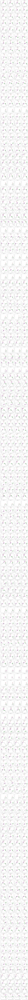

In [21]:
# Show all samples of specified label
sample_count = min(len(samples),150)
frame_count = K
fig, axs = plt.subplots(sample_count, frame_count, figsize=(5*frame_count,5*sample_count))
for sample_index, sample in enumerate(samples[:150]):
    for frame_index,frame in enumerate(sample):
        axis = axs[sample_index, frame_index]
        utils_for_students.visualize_pose(frame, axis)
        axis.set_title("Sample " +str(sample_index)+"-"+str(frame_index))
        

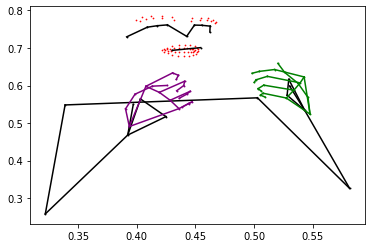

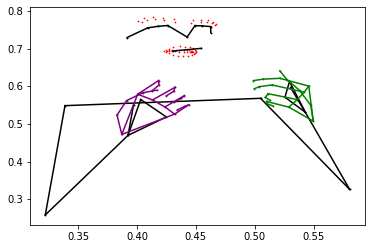

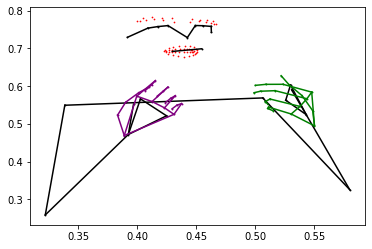

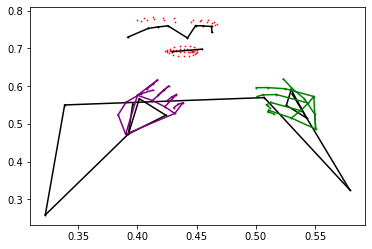

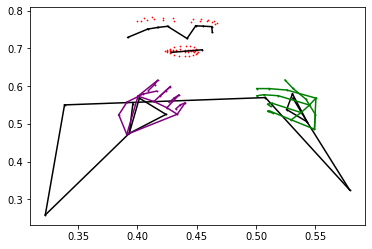

...

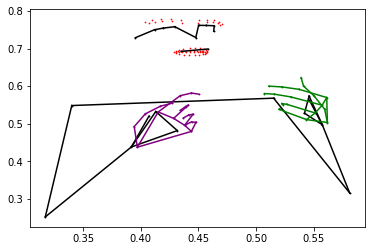

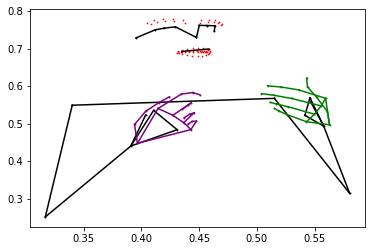

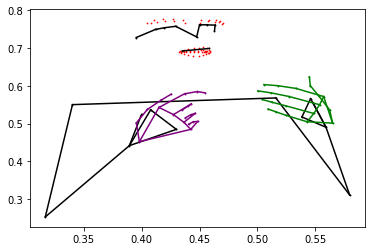

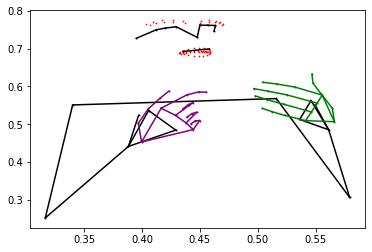

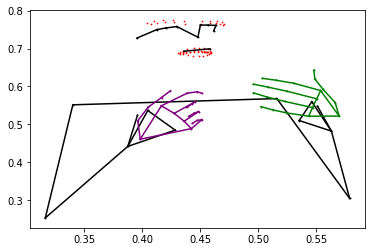

In [22]:
# Show all deames 
SAMPLE_INDEX = 3
for frame_index in range(len(original_samples[SAMPLE_INDEX])):
    utils_for_students.visualize_pose(original_samples[SAMPLE_INDEX][frame_index], plt)
    plt.show()
        

### Class histogram

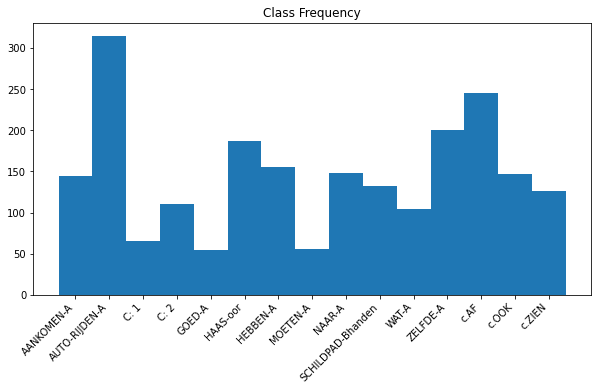

In [9]:
from matplotlib import pyplot as plt
import pandas as pd

plt.figure(figsize = (10,5))
data_class = pd.DataFrame(label_encoder().inverse_transform(y_train))
unique, counts = np.unique(data_class, return_counts=True)
plt.bar(unique, counts, 1)
plt.title('Class Frequency')
plt.xticks(rotation=45, ha='right')
plt.show()